In [1]:
import torch
import torchvision
from torchvision import models
import torchvision.transforms as transforms
from torchvision.io import read_image
import torch.optim as optim
import torch.nn as nn
import torch.nn.functional as F
import numpy as np
import pandas as pd

import cv2
import time
from PIL import Image
import os
from sklearn.model_selection import train_test_split
from torch.utils.data import Dataset, DataLoader

import matplotlib.pyplot as plt
%matplotlib inline

In [2]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [3]:
%cd /content/drive/MyDrive/cropped/Summer_cropped

/content/drive/.shortcut-targets-by-id/1OyAkH2b0cVaUeboEPS9upRyUI1okxBPQ/cropped/Summer_cropped


In [4]:
%ls

csv/  reis1/  reis2/  reis3/  reis4/  reis5/  reis6/  reis7/  xls/


In [10]:
class PlantsDataset(Dataset):
    def __init__(self, transform=None):
        self.image_files = []
        self.dirs = [i for i in os.listdir('.') if i[:4] == 'reis']
        self.img_labels = pd.DataFrame(columns=['0'])
        for i in self.dirs:
            for fold in os.listdir(i):
                if fold[0].isdigit(): #and fold not in ['186_cropped1_1', '195_1_cropped1_10', '197_1_cropped1_12_1', '186_cropped2_1', ]:
                    num = []
                    print(fold)
                    filename = fold.split('_')
                    ind = 0
                    while 'cropped' not in filename[ind]:
                        num.append(filename[ind])
                        ind += 1
                    num = '_'.join(num)
                    df = pd.read_csv('csv/' + num + '.csv', header=None, names=['0'])
                    self.img_labels = self.img_labels.append(df, ignore_index=True)
                    files = os.listdir(i + '/' + fold)
                    for j in sorted(files):
                        if j[:4] == '0000':
                            self.image_files.append(i + '/' + fold + '/' + j)
                    print(len(df), len(files))
        self.transform = transform
        print(len(self.img_labels))
        print(len(self.image_files))

    def __len__(self):
        return len(self.img_labels)

    def __getitem__(self, idx):
        img_path = self.image_files[idx]
        image = torch.from_numpy(cv2.imread(img_path))
        image = torch.swapaxes(image, 1, 2)
        image = torch.swapaxes(image, 0, 1)
        label = torch.Tensor(self.img_labels.iloc[idx])
        if self.transform:
            image = self.transform(image)
        return [image, label, img_path]

In [15]:
transform = transforms.Compose([
    transforms.ToPILImage(),
    transforms.Resize((128, 128)),
    transforms.ToTensor(),
    #transforms.Normalize((0.485, 0.456, 0.406), [0.229, 0.224, 0.225])
])

In [ ]:
dataset = PlantsDataset(transform = transform)
print(len(dataset))

tensor([2.]) reis1/185_2_cropped1_0_2/0000-00-00-01-391.png


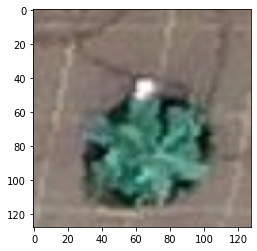

In [22]:
idx = 990
img = dataset[idx][0].permute(1, 2, 0).cpu().detach().numpy()
img = cv2.normalize(img, None, alpha = 0, beta = 255, norm_type = cv2.NORM_MINMAX, dtype = cv2.CV_32F)
img = img.astype(np.uint8)
plt.imshow(img)
print(dataset[idx][1], dataset[idx][2])

In [226]:
### самая важная функция 

def make_mask(idx, bounds_plant, bounds_ground = None, save_fig = True, iters1 = 3, iters2 = 2, iters3 = 1):
    img = dataset[idx][0].permute(1, 2, 0).cpu().detach().numpy()
    img = cv2.normalize(img, None, alpha = 0, beta = 255, norm_type = cv2.NORM_MINMAX, dtype = cv2.CV_32F)
    img = img.astype(np.uint8)

    #min0, max0, min1, max1, min2, max2 = bounds_plant
    #mingr0, maxgr0, mingr1, maxgr1, mingr2, maxgr2 = bounds_ground
    a, b, c, d = bounds_plant
    fragment_plant = img[a : b, c : d, :]
    min0, max0, min1, max1, min2, max2 = np.min(fragment_plant[:, :, 0]), np.max(fragment_plant[:, :, 0]), np.min(fragment_plant[:, :, 1]), \
                                         np.max(fragment_plant[:, :, 1]), np.min(fragment_plant[:, :, 2]), np.max(fragment_plant[:, :, 2])
    mask = ((img[:, :, 0] < max0) & (img[:, :, 0] > min0) & (img[:, :, 1] < max1) &
           (img[:, :, 1] > min1) & (img[:, :, 2] < max2) & (img[:, :, 2] > min2))
    
    masked = np.zeros(img.shape) #example.copy()
    masked[mask] = 255.


    if bounds_ground is not None:
        e, f, g, h = bounds_ground
        fragment_ground = img[e : f, g : h, :]
        mingr0, maxgr0, mingr1, maxgr1, mingr2, maxgr2 = np.min(fragment_ground[:, :, 0]), np.max(fragment_ground[:, :, 0]), np.min(fragment_ground[:, :, 1]), \
                                                    np.max(fragment_ground[:, :, 1]), np.min(fragment_ground[:, :, 2]), np.max(fragment_ground[:, :, 2])
        mask2 = ((img[:, :, 0] < maxgr0) & (img[:, :, 0] > mingr0) & (img[:, :, 1] < maxgr1) &
           (img[:, :, 1] > mingr1) & (img[:, :, 2] < maxgr2) & (img[:, :, 2] > mingr2)) 
         
        ground = np.zeros(img.shape)
        ground[(mask & mask2)] = 255. 
        kernel = np.ones((3, 3), np.uint8) #np.array([[1, 2, 1], [2, 2, 2], [1, 2, 1]], np.uint8)
        ground = cv2.morphologyEx(ground, cv2.MORPH_OPEN, kernel, iterations = iters1)
        ground = cv2.morphologyEx(ground, cv2.MORPH_CLOSE, kernel, iterations = iters2)
        ground = cv2.dilate(ground, kernel, iterations=iters3) 
        ans = masked - ground   
    else:
      ans = masked                             

    
    ans[ans < 0] = 0

    fig, axes = plt.subplots(1, 2, figsize = (12, 7))
    axes[0].imshow(img)
    axes[1].imshow(ans)
    axes[0].grid()
    axes[1].grid()
    fig.show()
    if save_fig:
        ans = Image.fromarray(ans.astype('uint8'), 'RGB')
        img = Image.fromarray(img.astype('uint8'), 'RGB')
        ans.save('./segment/masks/' + str(idx) + '.jpg') #summer_
        img.save('./segment/images/' + str(idx) + '.jpg') #summer_
        #im = Image.open(r"example.jpg")
    return ans

53 79 51 76 37 64
0 255 0 221 0 211


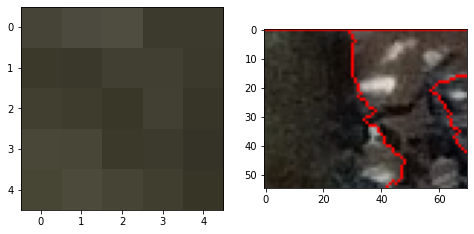

In [ ]:
a = [75, 80, 9, 14]
b =  [0, 55, 20, 90]

### дабы не быть лохом, как я, надо определить img
#img = ...
fragment = img[a[0]:a[1], a[2]:a[3], :]
fragment2 = img[b[0]:b[1], b[2]:b[3], :]

fig, axes = plt.subplots(1, 2, figsize=(8, 4))
axes[0].imshow(fragment)
axes[1].imshow(fragment2)
fig.show()

min0, max0, min1, max1, min2, max2 = np.min(fragment[:, :, 0]), np.max(fragment[:, :, 0]), np.min(fragment[:, :, 1]), np.max(fragment[:, :, 1]), np.min(fragment[:, :, 2]), np.max(fragment[:, :, 2])
print(min0, max0, min1, max1, min2, max2)

mingr0, maxgr0, mingr1, maxgr1, mingr2, maxgr2 = np.min(fragment2[:, :, 0]), np.max(fragment2[:, :, 0]), np.min(fragment2[:, :, 1]), np.max(fragment2[:, :, 1]), np.min(fragment2[:, :, 2]), np.max(fragment2[:, :, 2])
print(mingr0, maxgr0, mingr1, maxgr1, mingr2, maxgr2)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


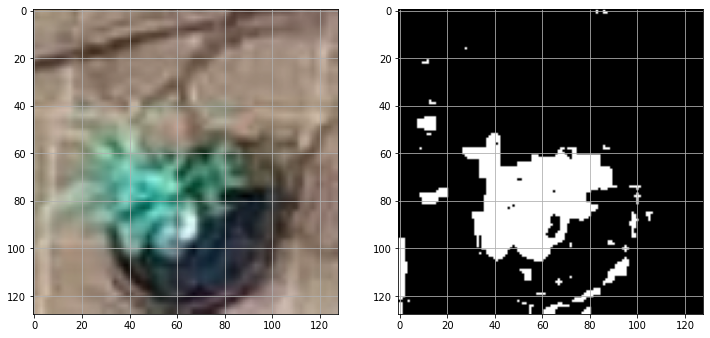

In [71]:
ans = make_mask(0, [55, 86, 36, 66], [0, 46, 0, 128], iters1 = 3, iters2 = 1, iters3 = 0) # 

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


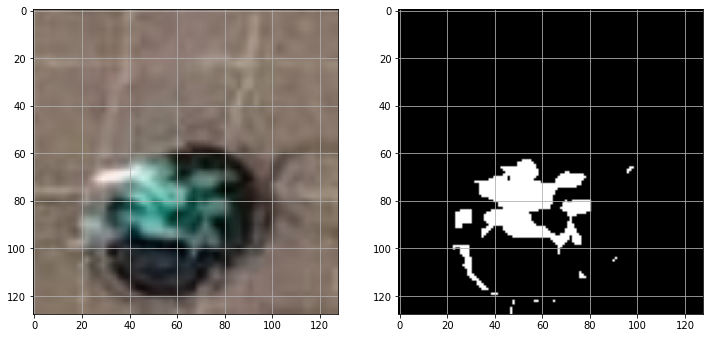

In [80]:
ans = make_mask(1, [62, 89, 44, 56], [0, 46, 0, 128],  iters1 = 1, iters2 = 1, iters3 = 2) # 

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


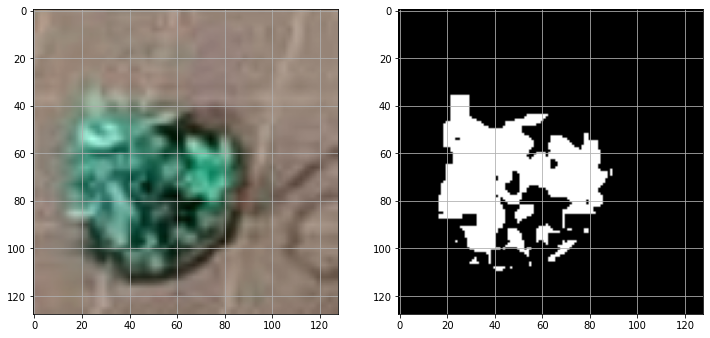

In [94]:
ans = make_mask(101, [47, 80, 20, 42], [0, 128, 88, 128], iters1 = 2, iters2 = 3, iters3 = 0) # 

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


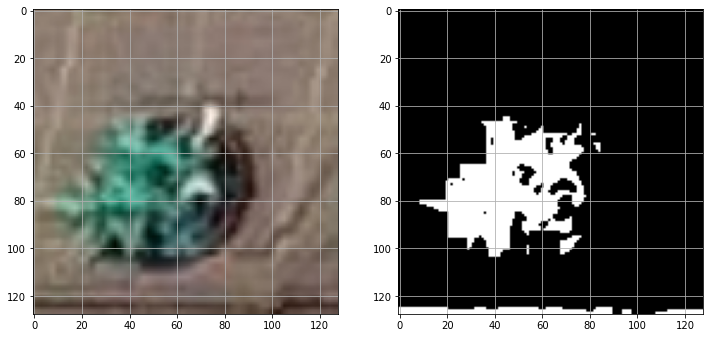

In [107]:
ans = make_mask(103, [56, 90, 22, 46], [0, 128, 93, 128], iters1 = 4, iters2 = 1, iters3 = 1) # 

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


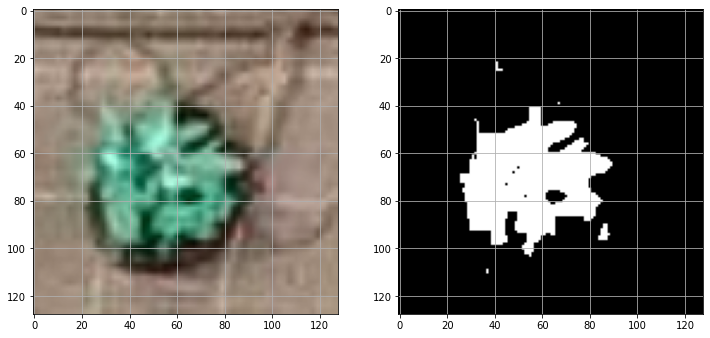

In [120]:
ans = make_mask(128, [42, 83, 29, 60], [0, 24, 0, 128], iters1 = 3, iters2 = 2, iters3 = 2) #[0, 128, 85, 128]

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


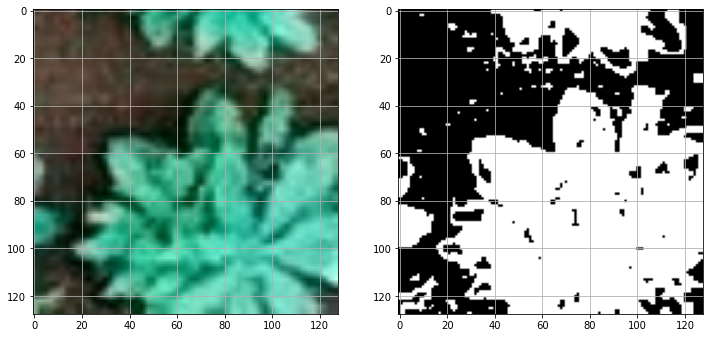

In [128]:
ans = make_mask(2128, [70, 120, 45, 100], [0, 50, 0, 30], iters1 = 1, iters2 = 2, iters3 = 0) #[0, 128, 85, 128]

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


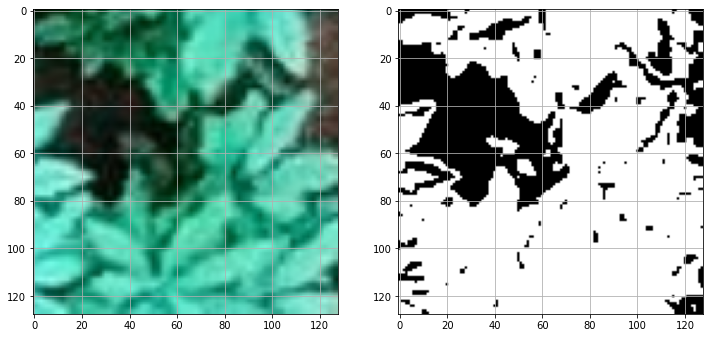

In [145]:
ans = make_mask(2150, [60, 128, 84, 106], [0, 50, 120, 128], iters1 = 3, iters2 = 1, iters3 = 2) #[30, 40, 20, 28]

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


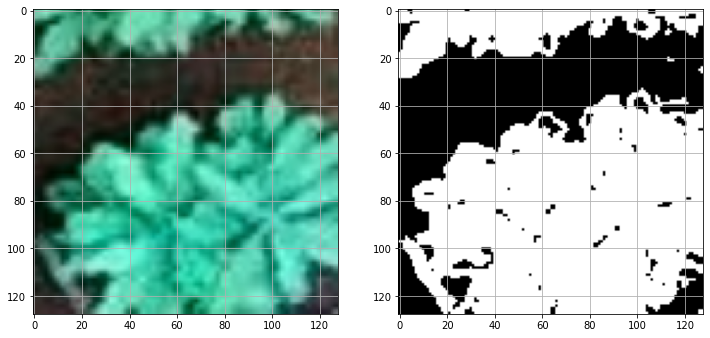

In [149]:
ans = make_mask(2170, [60, 128, 40, 100], [22, 50, 19, 40], iters1 = 3, iters2 = 1, iters3 = 2) #[30, 40, 20, 28]

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


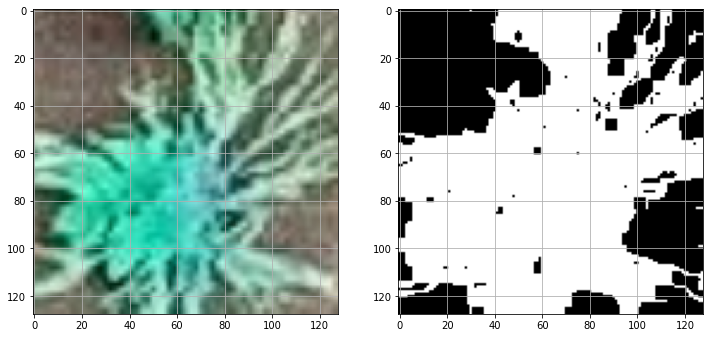

In [164]:
ans = make_mask(3000, [60, 110, 20, 80], [0, 45, 0, 38], iters1 = 2, iters2 = 0, iters3 = 0) #[30, 40, 20, 28]

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


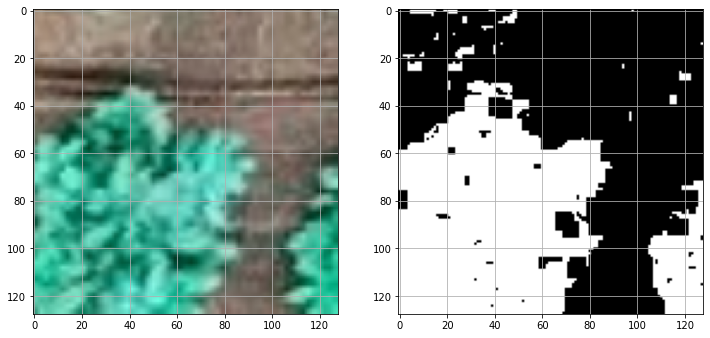

In [187]:
ans = make_mask(3060, [60, 128, 0, 70], [0, 28, 0, 128], iters1 = 2, iters2 = 1, iters3 = 1) #[30, 40, 20, 28]

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


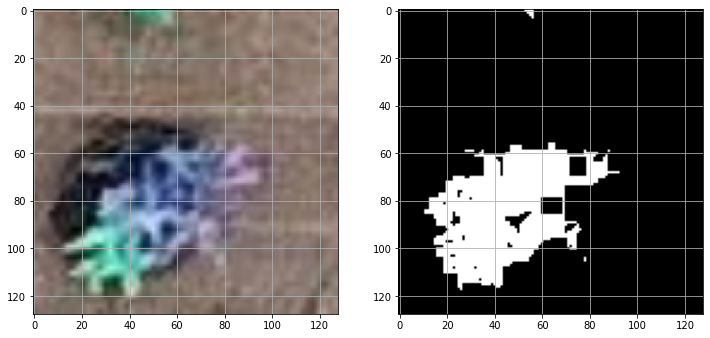

In [195]:
ans = make_mask(3120, [72, 110, 26, 43], [10, 50, 0, 128], iters1 = 2, iters2 = 1, iters3 = 1) #[30, 40, 20, 28]

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


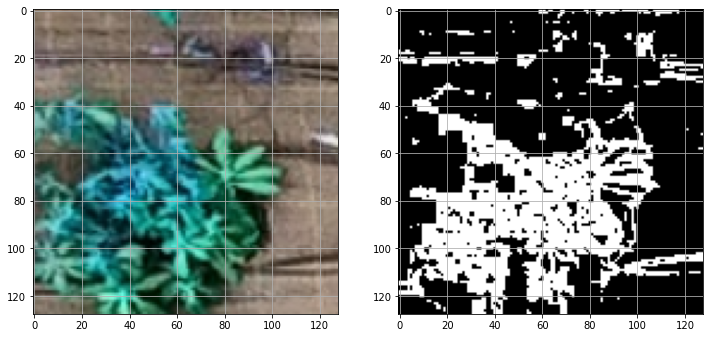

In [222]:
ans = make_mask(3500, [57, 84, 32, 70], [0, 128, 102, 128], iters1 = 2, iters2 = 0, iters3 = 1) #[0, 45, 64, 128]

In [ ]:
ans = make_mask(3500, [60, 90, 40, 80], [0, 40, 60, 128], save_fig = False, iters1 = 2, iters2 = 1, iters3 = 1) #[30, 40, 20, 28]

46/      51_1_1/  52_1/    53_2_2/  55_2_2/        segment/
48_1/    51_1_2/  52_2/    55_1_1/  csv/           summer/
48_2_1/  51_2_1/  53_1/    55_1_2/  example.jpg    Summer_cropped/
48_2_2/  51_2_2/  53_2_1/  55_2_1/  Pics_to_crop/


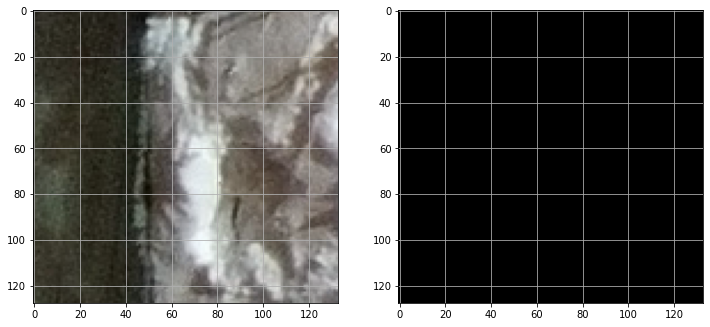

In [ ]:
ans = make_mask(0, [84, 85, 85, 86], [0, 40, 0, 125], iters1 = 2, iters2 = 1, iters3 = 1)

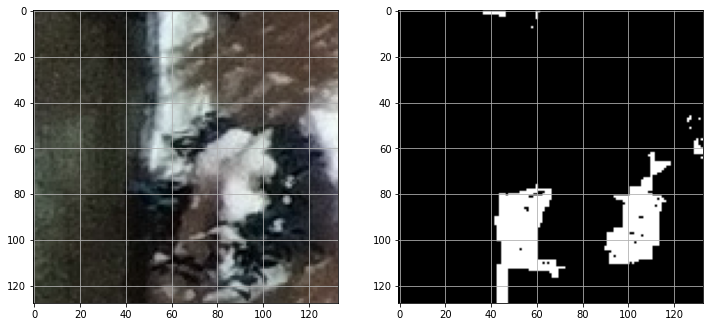

In [ ]:
ans = make_mask(1, [85, 110, 90, 110], [8, 46, 0, 125], iters1 = 3, iters2 = 1, iters3 = 1)

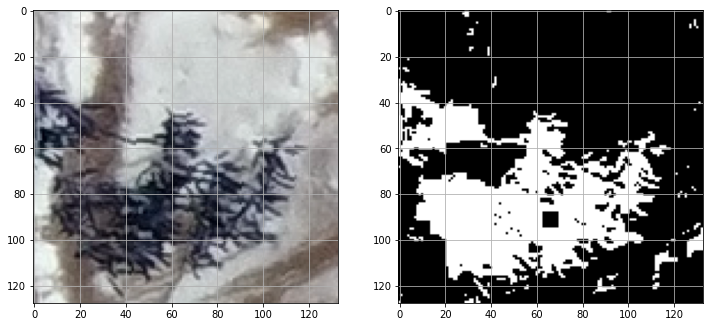

In [ ]:
ans = make_mask(8, [80, 100, 35, 60], [0, 30, 0, 125], iters1 = 1, iters2 = 2, iters3 = 2)

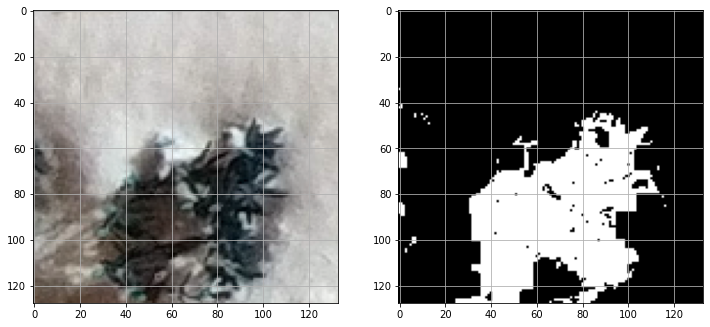

In [ ]:
ans = make_mask(12, [60, 88, 80, 100], [0, 125, 9, 24], iters1 = 2, iters2 = 3, iters3 = 2)

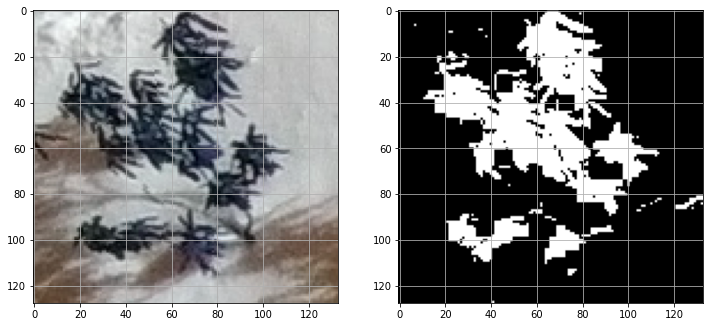

In [ ]:
ans = make_mask(17, [18, 30, 62, 80], [115, 125, 0, 130], iters1 = 1, iters2 = 1, iters3 = 2)

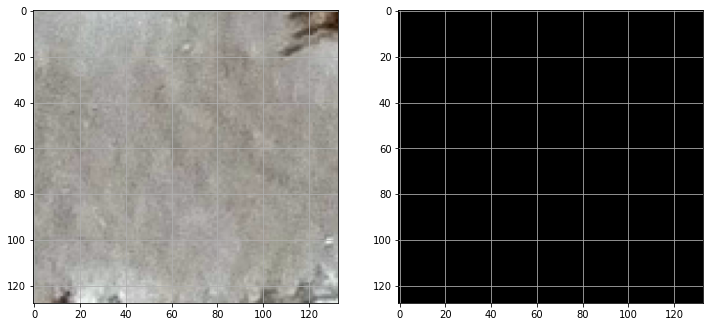

In [ ]:
ans = make_mask(23, [17, 18, 62, 63], [0, 40, 0, 130], iters1 = 1, iters2 = 1, iters3 = 2)

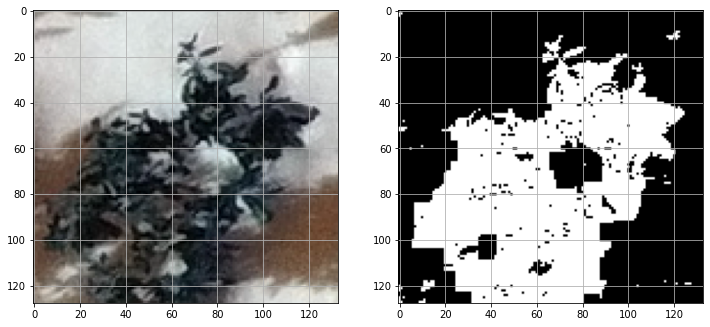

In [ ]:
ans = make_mask(25, [40, 56, 67, 100], [60, 125, 110, 130], iters1 = 2, iters2 = 2, iters3 = 1)

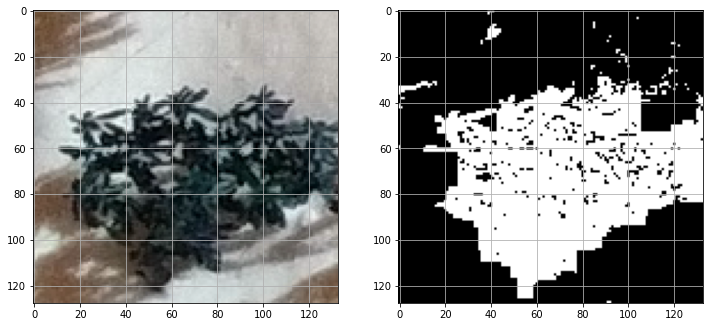

In [ ]:
ans = make_mask(26, [60, 90, 60, 82], [0, 30, 0, 130], iters1 = 2, iters2 = 1, iters3 = 4)

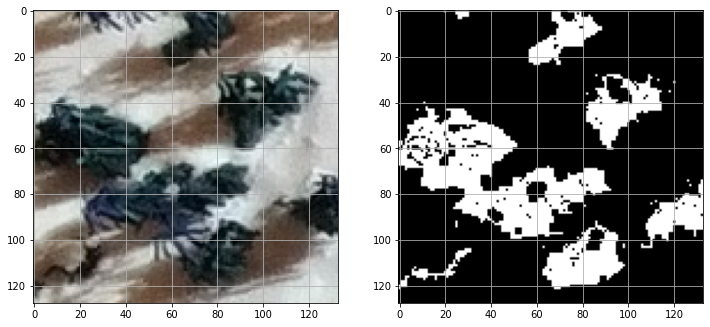

In [ ]:
ans = make_mask(28, [55, 90, 30, 40], [0, 23, 90, 130], iters1 = 0, iters2 = 1, iters3 = 1)

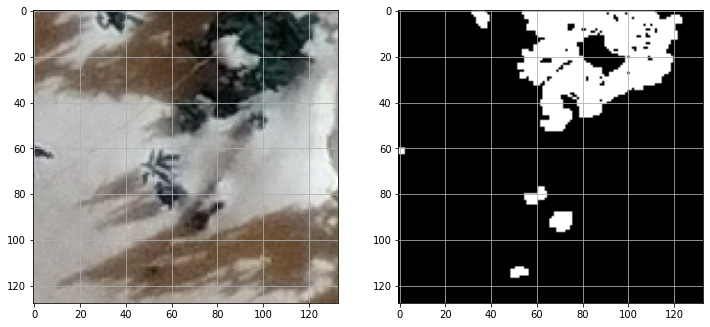

In [ ]:
ans = make_mask(32, [0, 27, 92, 115], [54, 125, 86, 122], iters1 = 0, iters2 = 1, iters3 = 0)

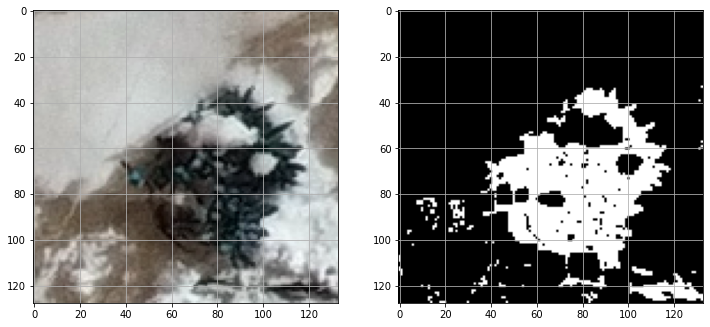

In [ ]:
ans = make_mask(35, [70, 100, 80, 95], [0, 125, 0, 37], iters1 = 1, iters2 = 1, iters3 = 1)

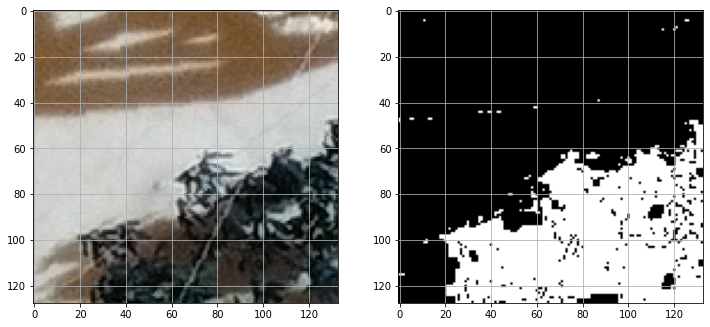

In [ ]:
ans = make_mask(42, [72, 87, 90, 100], [0, 125, 0, 18], iters1 = 1, iters2 = 2, iters3 = 0) # [0, 45, 0, 130]

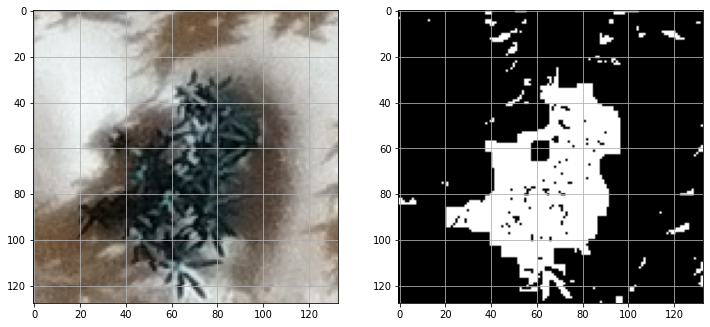

In [ ]:
ans = make_mask(47, [60, 84, 50, 80], [0, 125, 100, 130], iters1 = 2, iters2 = 3, iters3 = 1) # [0, 27, 0, 130]

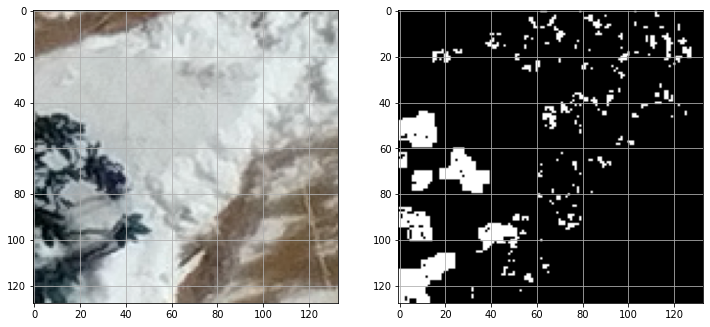

In [ ]:
ans = make_mask(53, [46, 70, 0, 20], [0, 125, 55, 130], iters1 = 1, iters2 = 2, iters3 = 0) # [0, 27, 0, 130]

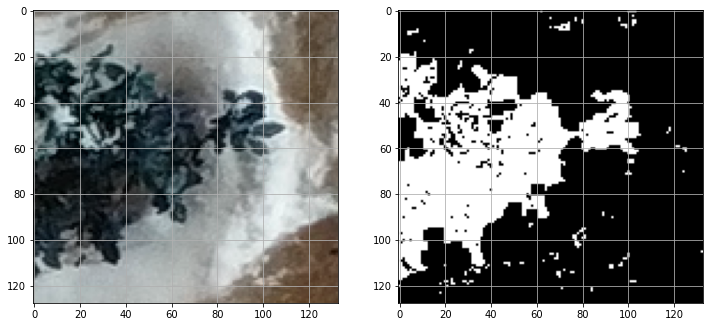

In [ ]:
ans = make_mask(61, [40, 72, 30, 58], [65, 125, 80, 130], iters1 = 1, iters2 = 1, iters3 = 1) # [0, 27, 0, 130]

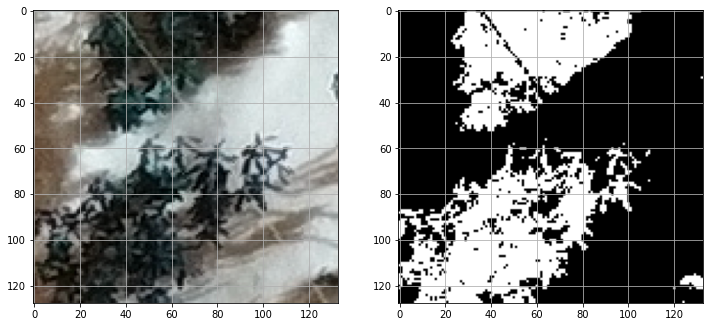

In [ ]:
ans = make_mask(67, [0, 20, 54, 80], [0, 74, 0, 23], iters1 = 1, iters2 = 2, iters3 = 1) # [0, 27, 0, 130]

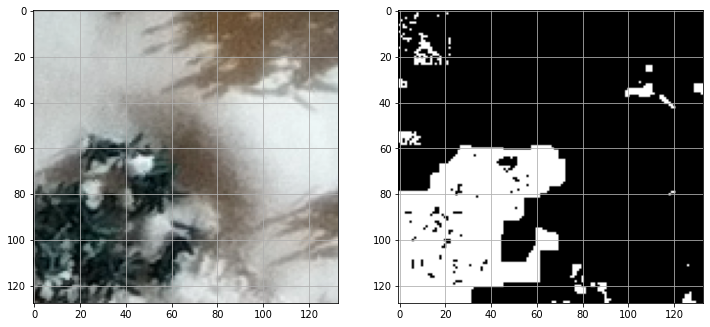

In [ ]:
ans = make_mask(72, [80, 105, 13, 33], [0, 52, 0, 130], iters1 = 3, iters2 = 3, iters3 = 2) # [0, 27, 0, 130]

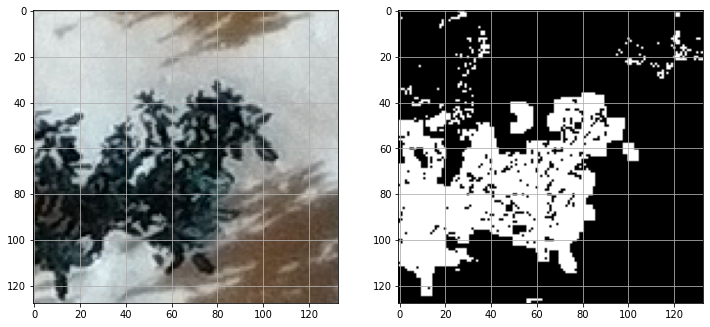

In [ ]:
ans = make_mask(73, [60, 85, 50, 80], [0, 128, 108, 132], iters1 = 1, iters2 = 2, iters3 = 0) # [0, 27, 0, 130]

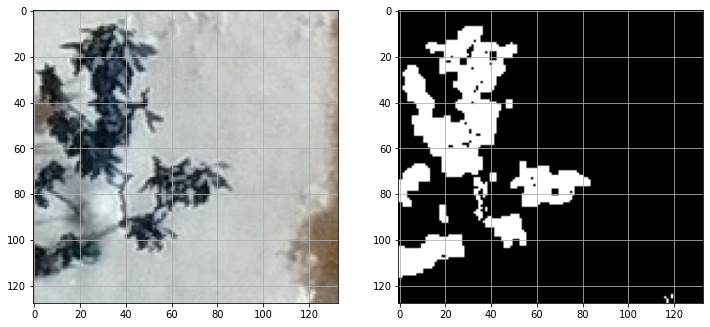

In [ ]:
ans = make_mask(77, [60, 85, 50, 80], [0, 128, 90, 132], iters1 = 1, iters2 = 1, iters3 = 0) #  [60, 85, 50, 80]

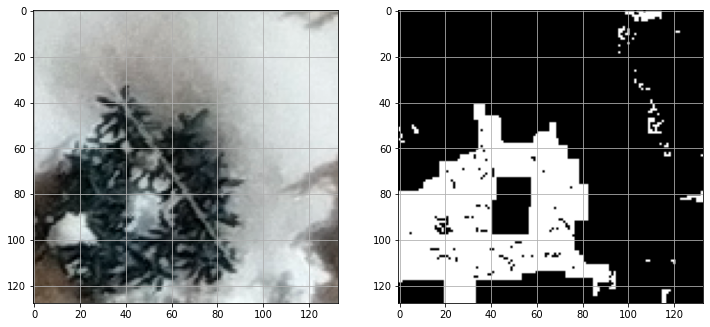

In [ ]:
ans = make_mask(84, [60, 88, 30, 70], [0, 120, 88, 132], iters1 = 4, iters2 = 0, iters3 = 2) #  [60, 85, 50, 80]

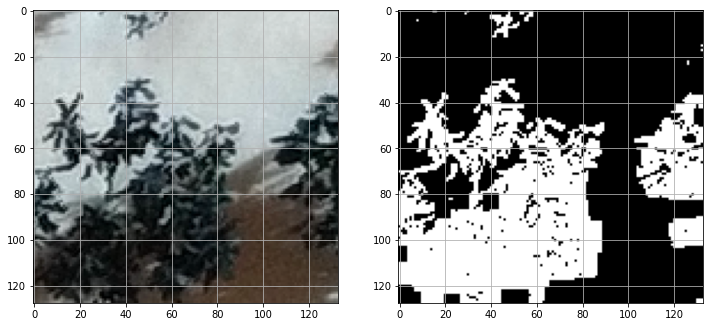

In [ ]:
ans = make_mask(87, [80, 100, 45, 80], [0, 125, 90, 103], iters1 = 2, iters2 = 3, iters3 = 1)

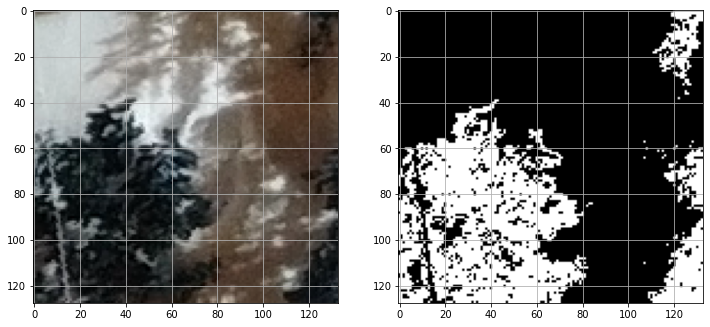

In [ ]:
ans = make_mask(99, [60, 70, 20, 30], [0, 35, 20, 100], iters1 = 2, iters2 = 4, iters3 = 1)

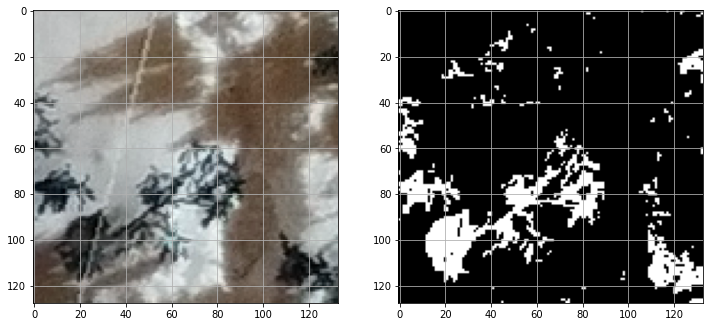

In [ ]:
ans = make_mask(100, [73, 80, 8, 16], [0, 50, 20, 110], iters1 = 1, iters2 = 1, iters3 = 1)

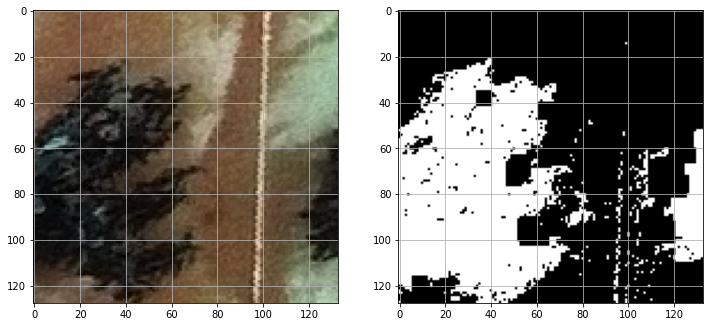

In [ ]:
ans = make_mask(140, [80, 100, 0, 20], [0, 63, 68, 125], iters1 = 1, iters2 = 1, iters3 = 2)

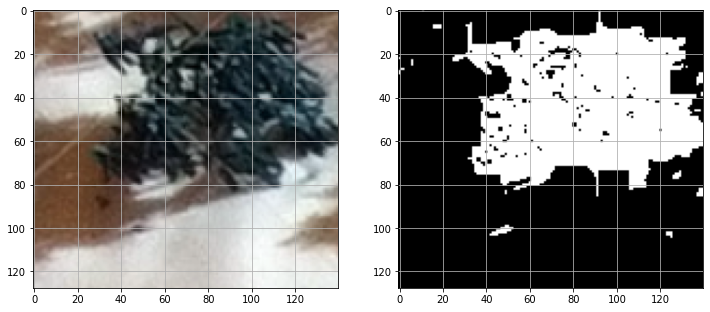

In [ ]:
ans = make_mask(177, [8, 40, 90, 108], [81, 120, 0, 53], iters1 = 3, iters2 = 2, iters3 = 2)

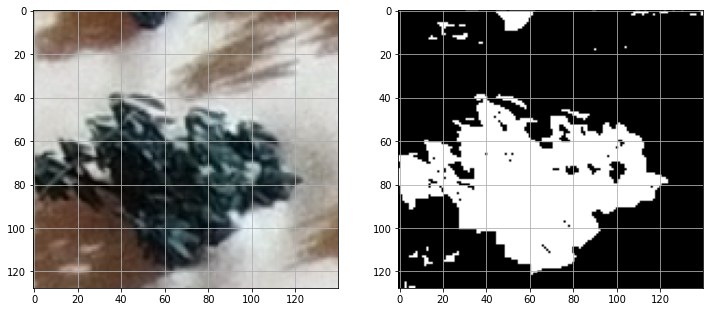

In [ ]:
ans = make_mask(181, [60, 83, 40, 60], [119, 125, 0, 135], iters1 = 2, iters2 = 1, iters3 = 1) #[15, 35, 0, 135]

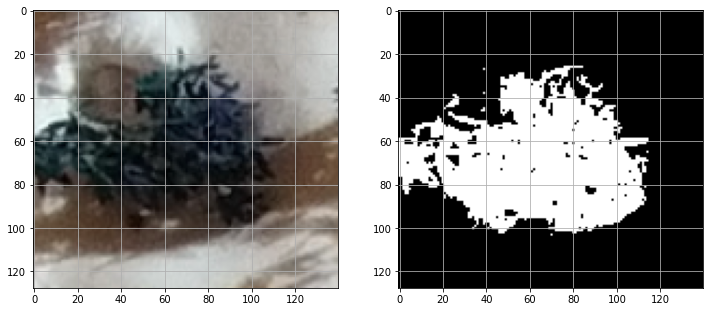

In [ ]:
ans = make_mask(196, [60, 83, 40, 60], [114, 125, 0, 135], iters1 = 2, iters2 = 1, iters3 = 1) #[15, 35, 0, 135]

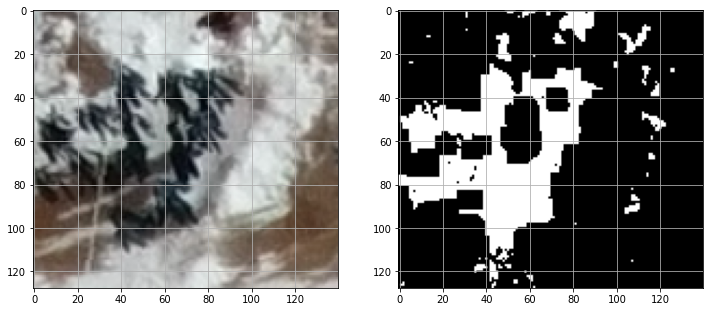

In [ ]:
ans = make_mask(204, [40, 60, 52, 80], [10, 125, 97, 135], iters1 = 2, iters2 = 1, iters3 = 2) #[115, 125, 0, 135],

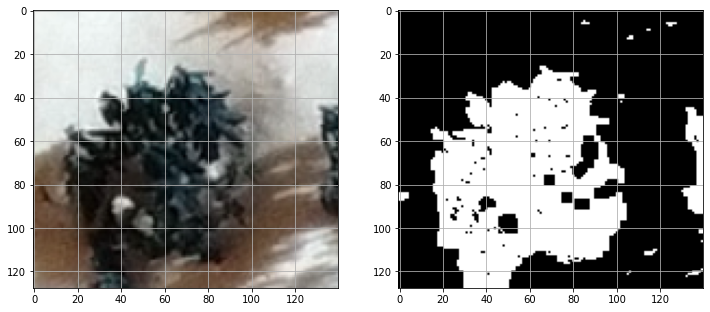

In [ ]:
ans = make_mask(212, [40, 65, 60, 85], [0, 125, 107, 130], iters1 = 1, iters2 = 2, iters3 = 1) #[115, 125, 0, 135],

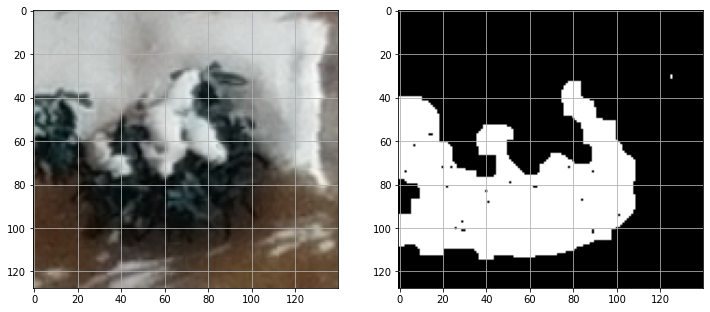

In [ ]:
ans = make_mask(230, [60, 90, 60, 85], [35, 125, 109, 130], iters1 = 2, iters2 = 2, iters3 = 0) #[0, 125, 109, 130]

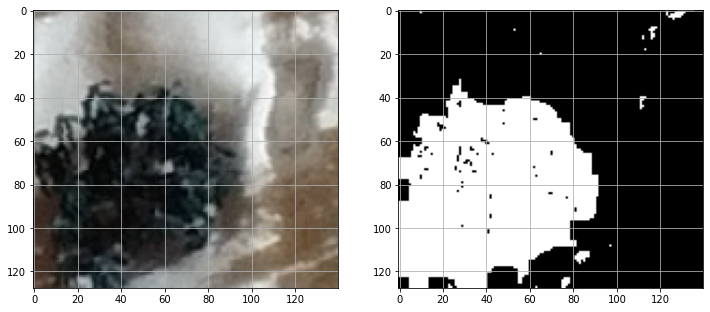

In [ ]:
ans = make_mask(236, [60, 90, 60, 80], [0, 125, 94, 137], iters1 = 2, iters2 = 3, iters3 = 2) #[0, 125, 109, 130]

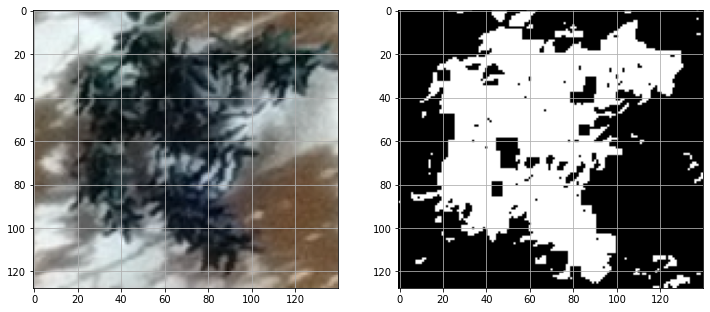

In [ ]:
ans = make_mask(256, [20, 50, 60, 83], [121, 126, 0, 138], iters1 = 2, iters2 = 2, iters3 = 0) #[0, 125, 109, 130]

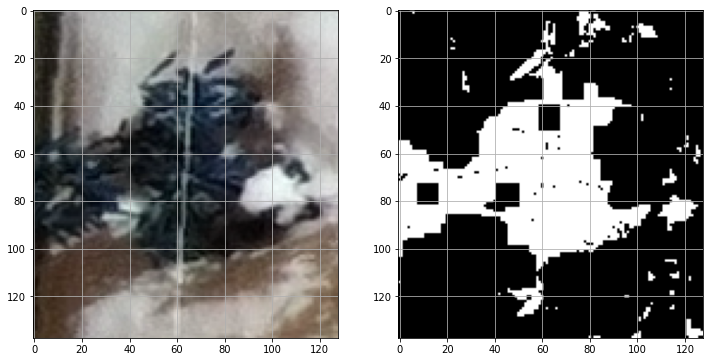

In [ ]:
ans = make_mask(301, [60, 100, 64, 82], [107, 126, 0, 138], iters1 = 3, iters2 = 1, iters3 = 1) 

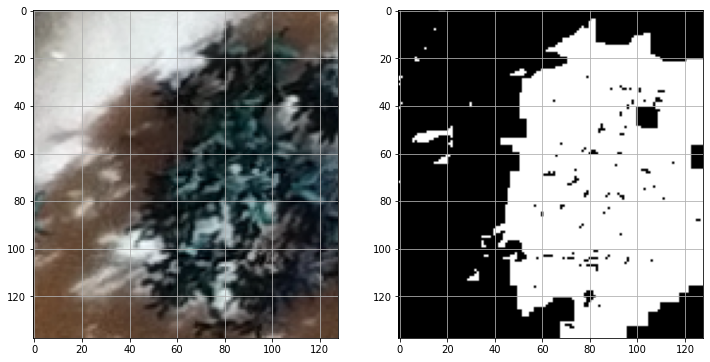

In [ ]:
ans = make_mask(378, [60, 100, 70, 110], [0, 126, 10, 38], iters1 = 3, iters2 = 1, iters3 = 0) 

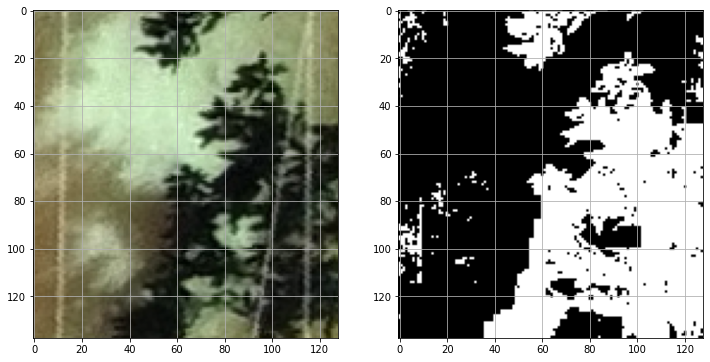

In [ ]:
ans = make_mask(396, [60, 83, 85, 101], [0, 138, 0, 33], iters1 = 2, iters2 = 3, iters3 = 2) # [16, 70, 16, 72]

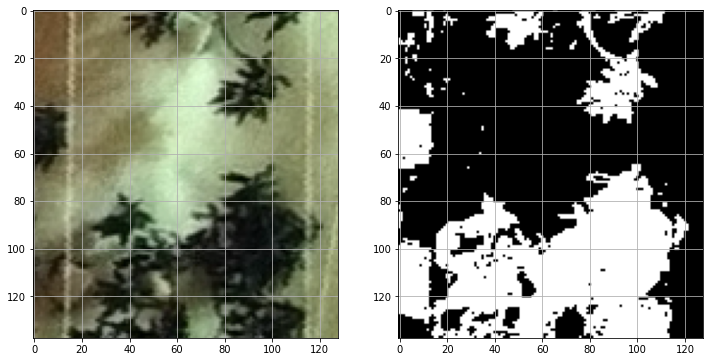

In [ ]:
ans = make_mask(397, [85, 115, 78, 100], [17, 39, 0, 75], iters1 = 1, iters2 = 3, iters3 = 1) # [16, 70, 16, 72]

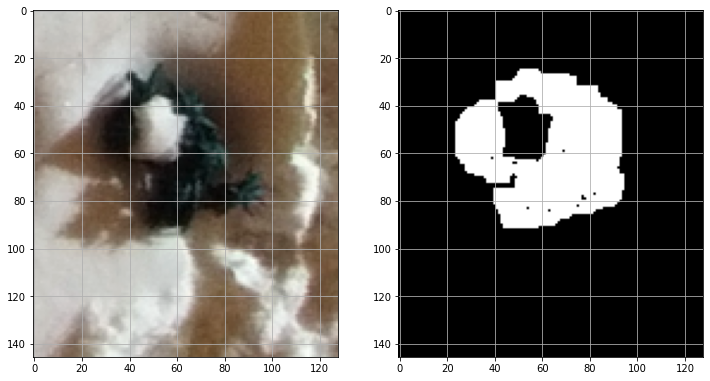

In [ ]:
ans = make_mask(402, [50, 80, 58, 78], [94, 143, 0, 125], iters1 = 0, iters2 = 3, iters3 = 0) # [16, 70, 16, 72]

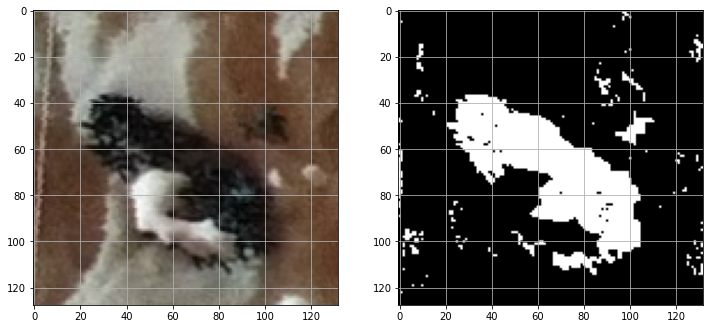

In [ ]:
ans = make_mask(411, [47, 65, 40, 62], [0, 36, 0, 126], iters1 = 1, iters2 = 2, iters3 = 2) # [16, 70, 16, 72]

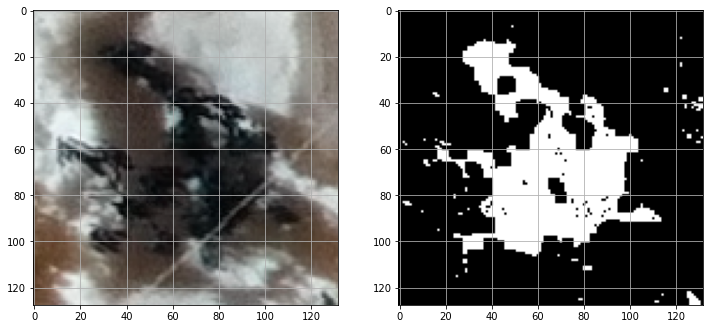

In [ ]:
ans = make_mask(425, [60, 82, 60, 84], [110, 125, 0, 128], iters1 = 1, iters2 = 1, iters3 = 1) # [16, 70, 16, 72]

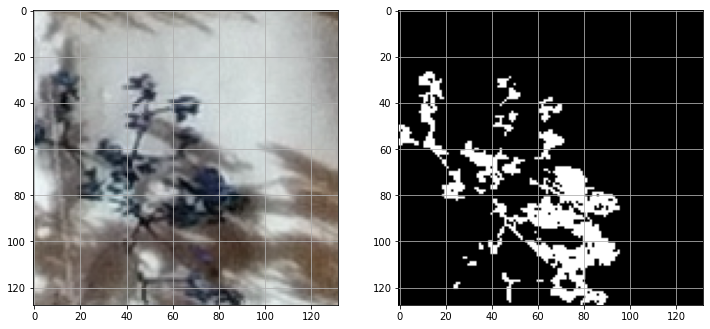

In [ ]:
ans = make_mask(501, [70, 80, 70, 80], [0, 125, 94, 128], iters1 = 3, iters2 = 1, iters3 = 0) # [16, 70, 16, 72]

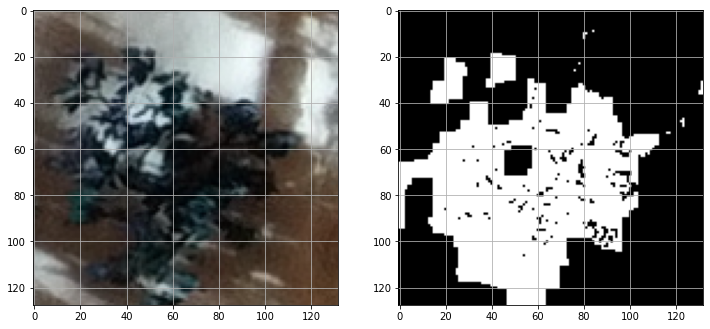

In [ ]:
ans = make_mask(510, [40, 70, 20, 57], [0, 126, 113, 128], iters1 = 3, iters2 = 2, iters3 = 1) # [16, 70, 16, 72]

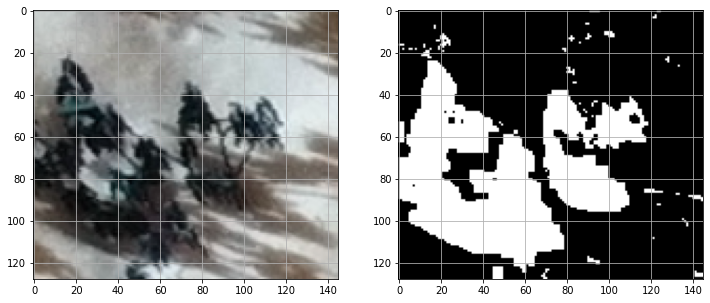

In [ ]:
ans = make_mask(589, [48, 80, 20, 42], [0, 126, 118, 142], iters1 = 1, iters2 = 2, iters3 = 0) # [16, 70, 16, 72]

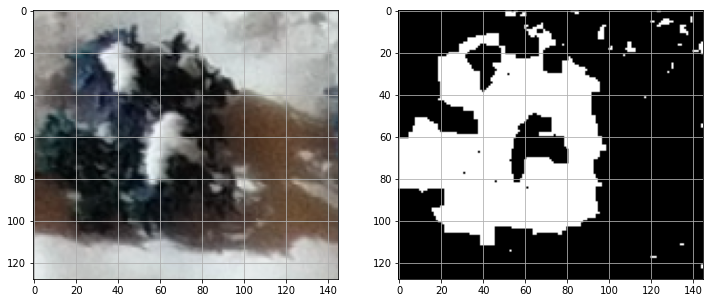

In [ ]:
ans = make_mask(597, [51, 85, 30, 51], [0, 126, 100, 138], iters1 = 2, iters2 = 1, iters3 = 1) # [16, 70, 16, 72]

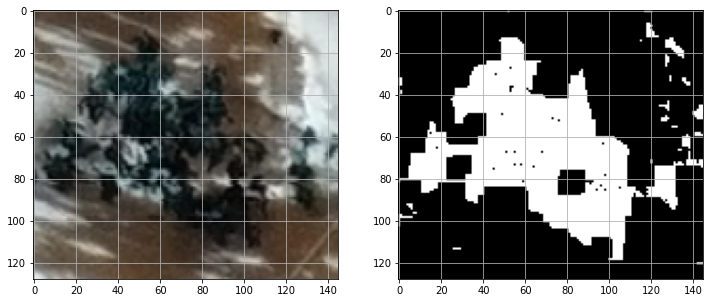

In [ ]:
ans = make_mask(617, [40, 70, 40, 70], [0, 10, 0, 138], iters1 = 4, iters2 = 0, iters3 = 0) # [16, 70, 16, 72]

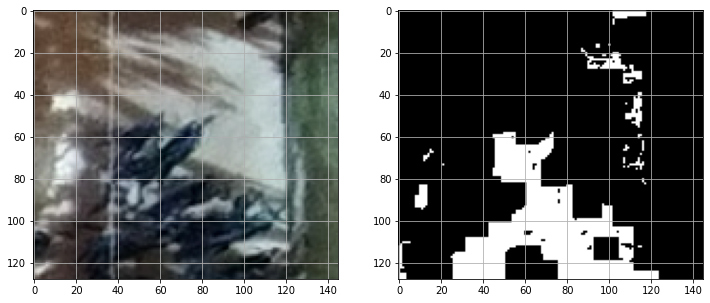

In [ ]:
ans = make_mask(701, [83, 119, 40, 70], [7, 48, 0, 144], iters1 = 4, iters2 = 0, iters3 = 1) # [16, 70, 16, 72]

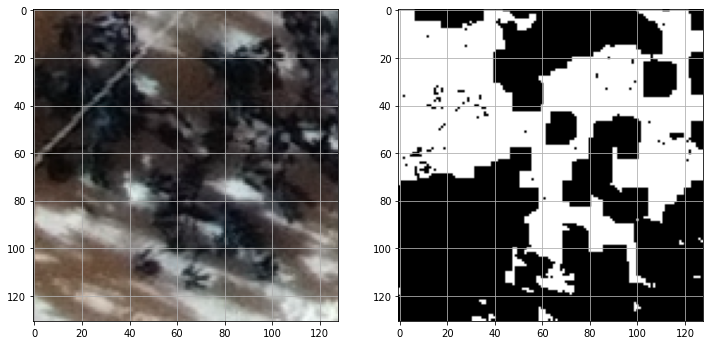

In [ ]:
ans = make_mask(756, [40, 60, 80, 110], [113, 130, 0, 127], iters1 = 2, iters2 = 2, iters3 = 2) # [16, 70, 16, 72]

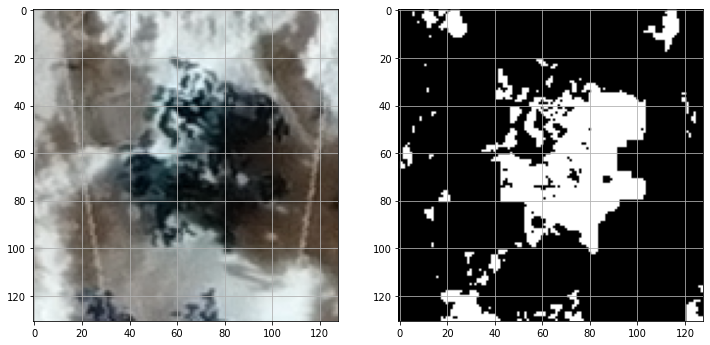

In [ ]:
ans = make_mask(790, [40, 60, 80, 110], [0, 132, 107, 128], iters1 = 3, iters2 = 3, iters3 = 1) # [113, 130, 0, 127]

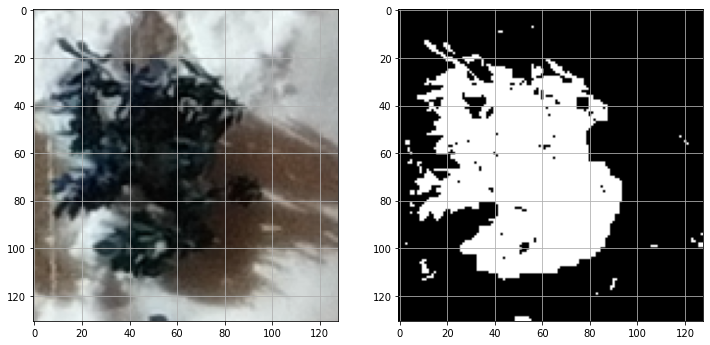

In [ ]:
ans = make_mask(821, [40, 60, 40, 70], [0, 132, 96, 128], iters1 = 1, iters2 = 3, iters3 = 1) # [113, 130, 0, 127]

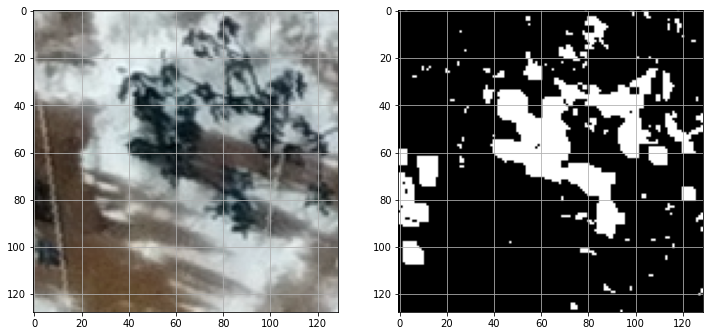

In [ ]:
ans = make_mask(910, [40, 62, 51, 67], [108, 130, 0, 128], iters1 = 1, iters2 = 2, iters3 = 0) # [113, 130, 0, 127]

In [ ]:
2

2

#### Создаём датасет для картинок с масками, берём чужую UNet и обучаем её на размеченных нами данных

In [ ]:
class MaskDataset(Dataset):
    def __init__(self, transform=None):
        self.image_files = []
        self.mask_files = []
        #self.dirs = [i for i in os.listdir('./segment/masks')]
        for i in os.listdir('./segment/masks'):
            #files = os.listdir(i)
            #for j in sorted(files):
            self.mask_files.append('./segment/masks/' + i)
        for i in os.listdir('./segment/images'):
            self.image_files.append('./segment/images/' + i)  
        self.transform = transform
        print(self.image_files)

    def __len__(self):
        return len(self.image_files)

    def __getitem__(self, idx):
        img_path = self.image_files[idx]
        mask_path = self.mask_files[idx]
        image = torch.from_numpy(cv2.imread(img_path))
        mask = torch.from_numpy(cv2.imread(mask_path))
        image = torch.swapaxes(image, 1, 2)
        image = torch.swapaxes(image, 0, 1)
        mask = torch.swapaxes(mask, 1, 2)
        mask = torch.swapaxes(mask, 0, 1)
        if self.transform:
            image = self.transform(image)
            mask = self.transform(mask)
        return [image, mask]

In [ ]:
transform_mask = transforms.Compose([
    transforms.ToPILImage(),
    transforms.Resize((128, 128)),
    #transforms.RandomHorizontalFlip(),
    #transforms.RandomVerticalFlip(),
    transforms.ToTensor(),
    #transforms.Normalize((0.485, 0.456, 0.406), [0.229, 0.224, 0.225])
])

segment_dataset = MaskDataset(transform = transform_mask)
print(len(segment_dataset))

['./segment/images/2.jpg', './segment/images/0.jpg', './segment/images/1.jpg', './segment/images/8.jpg', './segment/images/12.jpg', './segment/images/17.jpg', './segment/images/23.jpg', './segment/images/26.jpg', './segment/images/28.jpg', './segment/images/32.jpg', './segment/images/35.jpg', './segment/images/42.jpg', './segment/images/47.jpg', './segment/images/53.jpg', './segment/images/61.jpg', './segment/images/67.jpg', './segment/images/87.jpg', './segment/images/99.jpg', './segment/images/100.jpg', './segment/images/140.jpg', './segment/images/177.jpg', './segment/images/181.jpg', './segment/images/196.jpg', './segment/images/204.jpg', './segment/images/212.jpg', './segment/images/230.jpg', './segment/images/236.jpg', './segment/images/256.jpg', './segment/images/301.jpg', './segment/images/378.jpg', './segment/images/396.jpg', './segment/images/397.jpg', './segment/images/402.jpg', './segment/images/425.jpg', './segment/images/501.jpg', './segment/images/510.jpg', './segment/im

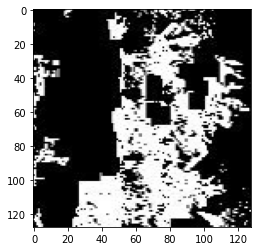

In [ ]:
example = segment_dataset[0][1].permute(1, 2, 0).cpu().detach().numpy()
example = cv2.normalize(example, None, alpha = 0, beta = 255, norm_type = cv2.NORM_MINMAX, dtype = cv2.CV_32F)
example = example.astype(np.uint8)

plt.imshow(Image.fromarray(example))

In [ ]:
def double_conv(in_channels, out_channels):
    return nn.Sequential(
        nn.Conv2d(in_channels, out_channels, 3, padding=1),
        nn.ReLU(inplace=True),
        nn.Conv2d(out_channels, out_channels, 3, padding=1),
        nn.ReLU(inplace=True)) 

class UNet(nn.Module):
    def __init__(self, n_class):
        super().__init__()           
        self.dconv_down1 = double_conv(3, 64)
        self.dconv_down2 = double_conv(64, 128)
        self.dconv_down3 = double_conv(128, 256)
        self.dconv_down4 = double_conv(256, 512)        

        self.maxpool = nn.MaxPool2d(2)
        self.upsample = nn.Upsample(scale_factor=2, mode='bilinear', align_corners=True)        
        
        self.dconv_up3 = double_conv(256 + 512, 256)
        self.dconv_up2 = double_conv(128 + 256, 128)
        self.dconv_up1 = double_conv(128 + 64, 64)
        
        self.conv_last = nn.Conv2d(64, n_class, 1)
        
        
    def forward(self, x):
        conv1 = self.dconv_down1(x)
        x = self.maxpool(conv1)

        conv2 = self.dconv_down2(x)
        x = self.maxpool(conv2)
        
        conv3 = self.dconv_down3(x)
        x = self.maxpool(conv3)   
        
        x = self.dconv_down4(x)
        
        x = self.upsample(x)        
        x = torch.cat([x, conv3], dim=1) 
        x = self.dconv_up3(x)
        x = self.upsample(x)        
        x = torch.cat([x, conv2], dim=1)       
        x = self.dconv_up2(x)
        x = self.upsample(x)        
        x = torch.cat([x, conv1], dim=1)   
        x = self.dconv_up1(x)
        out = self.conv_last(x)
        
        return out

In [ ]:
from torch.utils.data.sampler import SubsetRandomSampler

batch_size = 8
validation_split = .2
shuffle_dataset = True
random_seed= 42

dataset_size = len(segment_dataset)
indices = list(range(dataset_size))
split = int(np.floor(validation_split * dataset_size))
if shuffle_dataset :
    np.random.seed(random_seed)
    np.random.shuffle(indices)
train_indices, val_indices = indices[split:], indices[:split]

train_sampler = SubsetRandomSampler(train_indices)
valid_sampler = SubsetRandomSampler(val_indices)

train_loader = torch.utils.data.DataLoader(segment_dataset, batch_size=batch_size, sampler=train_sampler)
validation_loader = torch.utils.data.DataLoader(segment_dataset, batch_size=batch_size, sampler=valid_sampler)


#model = models.resnet18(pretrained = True)
#model.fc = nn.Linear(in_features=512, out_features=1, bias=True) #out_features=1
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
model = UNet(n_class = 3)
#model = torchvision.models.segmentation.deeplabv3_resnet101()
model = model.to(device)

#loss_function = nn.CrossEntropyLoss()
optimizer = torch.optim.Adadelta(model.parameters(), lr=1.)
scheduler = torch.optim.lr_scheduler.StepLR(optimizer, 4, gamma=0.94)
#scheduler = torch.optim.lr_scheduler.ExponentialLR(optimizer, gamma = 0.99)
num_epochs = 24


In [ ]:
from collections import defaultdict

def dice_loss(pred, target, smooth = 1.):
    pred = pred.contiguous()
    target = target.contiguous()    
    intersection = (pred * target).sum(dim=2).sum(dim=2)  
    loss = (1 - ((2. * intersection + smooth) / (pred.sum(dim=2).sum(dim=2) + target.sum(dim=2).sum(dim=2) + smooth)))
    return loss.mean()

def calc_loss(pred, target, metrics, bce_weight=0.5):
    bce = F.binary_cross_entropy_with_logits(pred, target)
    pred = F.sigmoid(pred)
    dice = dice_loss(pred, target)
    loss = bce * bce_weight + dice * (1 - bce_weight)
    metrics['bce'] += bce.data.cpu().numpy() * target.size(0)
    metrics['dice'] += dice.data.cpu().numpy() * target.size(0)
    metrics['loss'] += loss.data.cpu().numpy() * target.size(0)
    return loss, metrics


def train_model(model, optimizer, scheduler, num_epochs=25):
    best_loss = 1e10

    for epoch in range(num_epochs):
        print('Epoch {}/{}'.format(epoch + 1, num_epochs))
        #since = time.time()

        for phase in ['train', 'val']:
            if phase == 'train':
                model.train()  # Set model to training mode
            else:
                model.eval()   # Set model to evaluate mode

            metrics = defaultdict(float)
            epoch_samples = 0
            
            dataloader = train_loader if phase == 'train' else validation_loader
            for inputs, labels in dataloader:
                inputs = inputs.to(device)
                labels = labels.to(device)             
              
                optimizer.zero_grad()
                with torch.set_grad_enabled(phase == 'train'):
                    outputs = model(inputs)
                    loss, metrics = calc_loss(outputs, labels, metrics)

                    if phase == 'train':
                        loss.backward()
                        optimizer.step()
                        scheduler.step()

                epoch_samples += inputs.size(0)

            outputs = []
            for k in metrics.keys():
                outputs.append("{}: {:4f}".format(k, metrics[k] / epoch_samples))
            print("{}: {}".format(phase, ", ".join(outputs))) 

            epoch_loss = metrics['loss'] / epoch_samples

           
            if phase == 'val' and epoch_loss < best_loss:
                best_loss = epoch_loss

        #time_elapsed = time.time() - since
        #print('{:.0f}m {:.0f}s'.format(time_elapsed // 60, time_elapsed % 60))
    print('Best val loss: {:4f}'.format(best_loss))

In [ ]:
train_model(model, optimizer, scheduler, num_epochs=16)

Epoch 1/16


/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:1709: UserWarning: nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.
  warnings.warn("nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.")


train: bce: 0.679431, dice: 0.676345, loss: 0.677888
val: bce: 0.673041, dice: 0.651503, loss: 0.662272
Epoch 2/16
train: bce: 0.647638, dice: 0.676448, loss: 0.662043
val: bce: 0.543383, dice: 0.640951, loss: 0.592167
Epoch 3/16
train: bce: 0.463639, dice: 0.659513, loss: 0.561576
val: bce: 0.411279, dice: 0.581101, loss: 0.496190
Epoch 4/16
train: bce: 0.413949, dice: 0.611795, loss: 0.512872
val: bce: 0.418064, dice: 0.560360, loss: 0.489212
Epoch 5/16
train: bce: 0.432484, dice: 0.598597, loss: 0.515540
val: bce: 0.370483, dice: 0.510740, loss: 0.440612
Epoch 6/16
train: bce: 0.396703, dice: 0.568774, loss: 0.482739
val: bce: 0.363729, dice: 0.489213, loss: 0.426471
Epoch 7/16
train: bce: 0.377944, dice: 0.537868, loss: 0.457906
val: bce: 0.340001, dice: 0.454239, loss: 0.397120
Epoch 8/16
train: bce: 0.388065, dice: 0.504253, loss: 0.446159
val: bce: 0.322551, dice: 0.394743, loss: 0.358647
Epoch 9/16
train: bce: 0.383889, dice: 0.458990, loss: 0.421440
val: bce: 0.278704, dice: 0

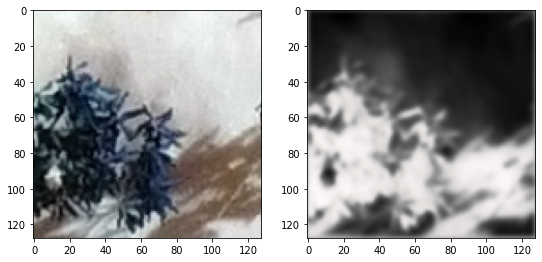

In [ ]:
tensor_example = dataset[211][0]
example =  tensor_example.permute(1, 2, 0).cpu().detach().numpy()
example = cv2.normalize(example, None, alpha = 0, beta = 255, norm_type = cv2.NORM_MINMAX, dtype = cv2.CV_32F)
example = example.astype(np.uint8)

fig, ax = plt.subplots(1, 2, figsize = (9, 7))
ax[0].imshow(Image.fromarray(example))

mask_model = model(tensor_example.unsqueeze(0).to(device))
mask_model = mask_model.squeeze(0).permute(1, 2, 0).cpu().detach().numpy()
mask_model = cv2.normalize(mask_model, None, alpha = 0, beta = 255, norm_type = cv2.NORM_MINMAX, dtype = cv2.CV_32F)
mask_model = mask_model.astype(np.uint8)
ax[1].imshow(Image.fromarray(mask_model))
fig.show()

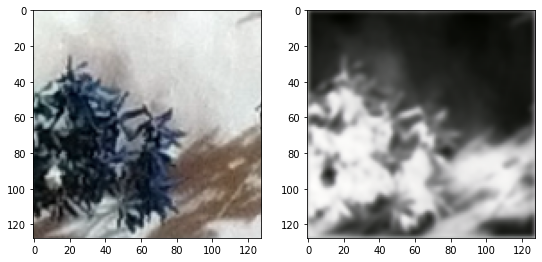

In [ ]:
tensor_example = dataset[211][0]
example =  tensor_example.permute(1, 2, 0).cpu().detach().numpy()
example = cv2.normalize(example, None, alpha = 0, beta = 255, norm_type = cv2.NORM_MINMAX, dtype = cv2.CV_32F)
example = example.astype(np.uint8)

fig, ax = plt.subplots(1, 2, figsize = (9, 7))
ax[0].imshow(Image.fromarray(example))

mask_model = model(tensor_example.unsqueeze(0).to(device))
mask_model = mask_model.squeeze(0).permute(1, 2, 0).cpu().detach().numpy()
mask_model = cv2.normalize(mask_model, None, alpha = 0, beta = 255, norm_type = cv2.NORM_MINMAX, dtype = cv2.CV_32F)
mask_model = mask_model.astype(np.uint8)
ax[1].imshow(Image.fromarray(mask_model))
fig.show()

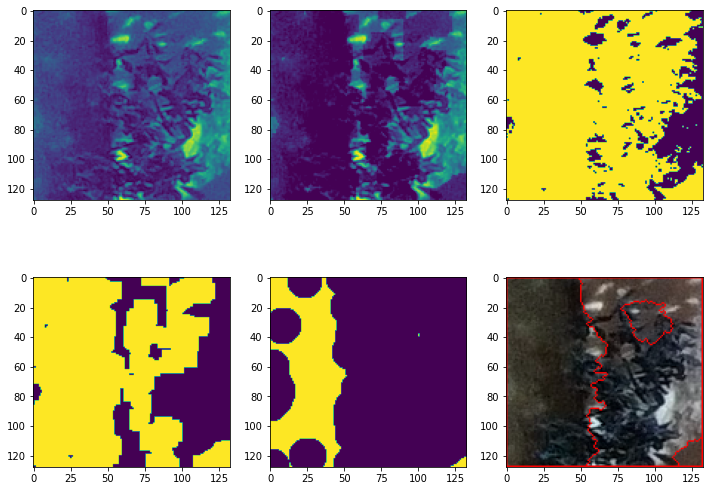

In [ ]:
### Эту хрень запускать не надо, она нужна только для осознания тщетности бытия

example = dataset[2][0].permute(1, 2, 0).cpu().detach().numpy()
example = cv2.normalize(example, None, alpha = 0, beta = 255, norm_type = cv2.NORM_MINMAX, dtype = cv2.CV_32F)
example = example.astype(np.uint8)
img = example.copy()
example = cv2.cvtColor(example, cv2.COLOR_BGR2GRAY) #cv2.COLOR_BGR2RGB)
ret, thresh = cv2.threshold(example, 0, 255, cv2.THRESH_BINARY_INV + cv2.THRESH_OTSU)
#print(example.shape)

kernel = np.ones((3, 3), np.uint8)
opening = cv2.morphologyEx(thresh, cv2.MORPH_OPEN, kernel, iterations = 5)

sure_bg = cv2.dilate(opening, kernel, iterations=3)

dist_transform = cv2.distanceTransform(opening, cv2.DIST_L2, 5)
ret, sure_fg = cv2.threshold(dist_transform, 0.42 * dist_transform.max(),  0.8 * dist_transform.max(), 0)
sure_fg = np.uint8(sure_fg)

unknown = cv2.subtract(sure_bg, sure_fg)

ret, markers = cv2.connectedComponents(sure_bg)
# Add one to all labels so that sure background is not 0, but 1
markers = markers + 1
# Now, mark the region of unknown with zero
markers[unknown==255] = 0

markers = cv2.watershed(img, markers)
img[markers == -1] = [255, 0, 0]

new_example = example.copy()
#new_example = cv2.bitwise_and(example, example, mask=opening)
cv2.addWeighted(opening, -0.15, example, 1.1, 0, new_example)

fig, axes = plt.subplots(2, 3, figsize = (12, 9))
axes[0, 0].imshow(example)
axes[0, 1].imshow(new_example)
axes[0, 2].imshow(thresh)
axes[1, 0].imshow(opening)
axes[1, 1].imshow(sure_fg)
axes[1, 2].imshow(img)
plt.show()

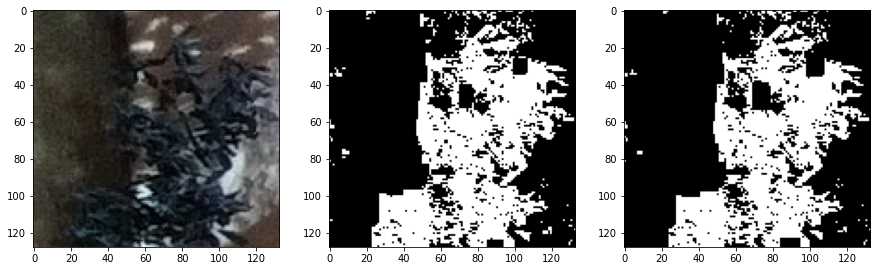

In [ ]:
example = dataset[2][0].permute(1, 2, 0).cpu().detach().numpy()
example = cv2.normalize(example, None, alpha = 0, beta = 255, norm_type = cv2.NORM_MINMAX, dtype = cv2.CV_32F)
example = example.astype(np.uint8)

#mask = np.zeros(example.shape)
#mask2 = np.ones(example.shape) * 255.
#mask_res = np.where(example )
#mask = example[80:95, 100:110, :]
mask = ((example[:, :, 0] < max0) & (example[:, :, 0] > min0) & (example[:, :, 1] < max1) &
           (example[:, :, 1] > min1) & (example[:, :, 2] < max2) & (example[:, :, 2] > min2))

mask2 = ((example[:, :, 0] < maxgr0) & (example[:, :, 0] > mingr0) & (example[:, :, 1] < maxgr1) &
           (example[:, :, 1] > mingr1) & (example[:, :, 2] < maxgr2) & (example[:, :, 2] > mingr2))

masked = np.zeros(example.shape) #example.copy()
masked[mask] = 255.

ground = np.zeros(example.shape) #example.copy()
ground[mask2] = 255.

kernel = np.ones((3, 3), np.uint8) #np.array([[1, 2, 1], [2, 2, 2], [1, 2, 1]], np.uint8)
ground0 = cv2.morphologyEx(ground, cv2.MORPH_OPEN, kernel, iterations = 3)
ground0 = cv2.morphologyEx(ground0, cv2.MORPH_CLOSE, kernel, iterations = 2)
ground = cv2.dilate(ground0, kernel, iterations=1)

fig, axes = plt.subplots(1, 3, figsize = (15, 9))
axes[0].imshow(example)
axes[1].imshow(masked - ground0)
axes[2].imshow(masked - ground)
ans = Image.fromarray((masked - ground).astype('uint8'), 'RGB')
ans.save("masks/example.jpg")